In [1]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
path1='/content/drive/MyDrive/Colab Notebooks'

In [3]:

import requests
from bs4 import BeautifulSoup
import pandas as pd
import time

# για τα nan values
import numpy as np

# για τα γραφήματα
import matplotlib.pyplot as plt

# για την επεξεργασία ελληνικών κειμένων
import spacy

In [4]:
!python -m spacy download el_core_news_sm

2023-07-09 13:39:17.973527: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 51.1 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [5]:
start_page = 2
end_page = 15

start_url = 'https://www.newsit.gr/category/megales-epixeiriseis/page/'

test_url = start_url + str(start_page)

In [6]:
# κατεβάζουμε τη δοκιμαστική σελίδα
response = requests.get(test_url)
doc = BeautifulSoup(response.text, 'html.parser')

In [7]:
teaser_articles_list = doc.find('div', {'class': 'content-area grid-parent mobile-grid-100 grid-75 tablet-grid-75'}).find_all('article')

In [8]:
teaser_articles_list[0]

<article class="">
<div class="image">
<a href="https://www.newsit.gr/megales-epixeiriseis/MyRoomie-se-anodiki-troxia-i-enallaktiki-lysi-stegasis-ta-ofeli-tis-sygkatoikisis-apo-ton-idryti-dominiko-priti/3805749/" style="background-image:url('https://www.newsit.gr/wp-content/uploads/2023/05/spitia_akinita_in_0805-768x530.jpg');" title="MyRoomie: Σε ανοδική τροχιά η εναλλακτική λύση στέγασης – Τα οφέλη της συγκατοίκησης από τον ιδρυτή Δομίνικο Πρίτη"></a>
</div>
<div>
<div class="entry-meta mb-05">
<span class="posted-on">
<time class="entry-date published" datetime="2023-06-26T16:50:46+03:00">
<svg aria-hidden="true" height="12" role="img" version="1.1" viewbox="0 0 12 12" width="12" xmlns="http://www.w3.org/2000/svg" xmlns:xlink="http://www.w3.org/1999/xlink">
<path class="st0" d="M6,0C2.7,0,0,2.7,0,6s2.7,6,6,6s6-2.7,6-6S9.3,0,6,0z M6,11C3.3,11,1,8.7,1,6S3.3,1.1,6,1.1s5,2.2,5,4.9
	S8.7,11,6,11z"></path>
<path class="st0" d="M6.6,6V2.7c0-0.3-0.3-0.4-0.5-0.4H5.9c-0.3,0-0.5,0.3-0.5,0.4v3.

In [9]:
print(teaser_articles_list[0].prettify())

<article class="">
 <div class="image">
  <a href="https://www.newsit.gr/megales-epixeiriseis/MyRoomie-se-anodiki-troxia-i-enallaktiki-lysi-stegasis-ta-ofeli-tis-sygkatoikisis-apo-ton-idryti-dominiko-priti/3805749/" style="background-image:url('https://www.newsit.gr/wp-content/uploads/2023/05/spitia_akinita_in_0805-768x530.jpg');" title="MyRoomie: Σε ανοδική τροχιά η εναλλακτική λύση στέγασης – Τα οφέλη της συγκατοίκησης από τον ιδρυτή Δομίνικο Πρίτη">
  </a>
 </div>
 <div>
  <div class="entry-meta mb-05">
   <span class="posted-on">
    <time class="entry-date published" datetime="2023-06-26T16:50:46+03:00">
     <svg aria-hidden="true" height="12" role="img" version="1.1" viewbox="0 0 12 12" width="12" xmlns="http://www.w3.org/2000/svg" xmlns:xlink="http://www.w3.org/1999/xlink">
      <path class="st0" d="M6,0C2.7,0,0,2.7,0,6s2.7,6,6,6s6-2.7,6-6S9.3,0,6,0z M6,11C3.3,11,1,8.7,1,6S3.3,1.1,6,1.1s5,2.2,5,4.9
	S8.7,11,6,11z">
      </path>
      <path class="st0" d="M6.6,6V2.7c0-0.3-0.3-

In [10]:
if teaser_articles_list:
    first_teaser_article = teaser_articles_list[0]
    link_element = first_teaser_article.find('a', href=True)

    if link_element:
        link = link_element['href']
        print(link)
    else:
        print("Link element not found in the first teaser article.")
else:
    print("No teaser articles found.")


https://www.newsit.gr/megales-epixeiriseis/MyRoomie-se-anodiki-troxia-i-enallaktiki-lysi-stegasis-ta-ofeli-tis-sygkatoikisis-apo-ton-idryti-dominiko-priti/3805749/


In [11]:
main_url = 'https://www.newsit.gr'
article_link = main_url + link
print(article_link)

https://www.newsit.grhttps://www.newsit.gr/megales-epixeiriseis/MyRoomie-se-anodiki-troxia-i-enallaktiki-lysi-stegasis-ta-ofeli-tis-sygkatoikisis-apo-ton-idryti-dominiko-priti/3805749/


In [12]:
teasers_list = []

for page_num in range(start_page, end_page+1):
    page_url = start_url + str(page_num)
    response = requests.get(page_url)
    doc = BeautifulSoup(response.text, 'html.parser')

    teaser_articles_list = doc.find_all('article')

    for teaser in teaser_articles_list:
        story_dict = {}
        try:
            link = teaser.find('a')['href']
            if link.startswith("http"):
                story_dict['url'] = link
            else:
                story_dict['url'] = main_url + link
        except:
            story_dict['url'] = ''
        teasers_list.append(story_dict)

    time.sleep(1)


In [13]:
# Δημιουργούμε dataframe από τη λίστα με τα dictionaries
newsit_teasers_df = pd.DataFrame(teasers_list)
newsit_teasers_df
print(newsit_teasers_df)

                                                   url
0    https://www.newsit.gr/megales-epixeiriseis/MyR...
1    https://www.newsit.gr/megales-epixeiriseis/Int...
2    https://www.newsit.gr/megales-epixeiriseis/Pep...
3    https://www.newsit.gr/megales-epixeiriseis/skl...
4    https://www.newsit.gr/megales-epixeiriseis/ane...
..                                                 ...
275  https://www.newsit.gr/megales-epixeiriseis/Tup...
276  https://www.newsit.gr/megales-epixeiriseis/Jum...
277  https://www.newsit.gr/megales-epixeiriseis/Lan...
278  https://www.newsit.gr/megales-epixeiriseis/Fri...
279  https://www.newsit.gr/megales-epixeiriseis/Eps...

[280 rows x 1 columns]


In [14]:
newsit_teasers_df.to_csv('/content/drive/MyDrive/Colab Notebooks/newsit_teasers.csv', index=False)

In [15]:
article_url = 'https://www.newsit.gr/megales-epixeiriseis/Public-Group-pano-apo-25-i-symmetoxi-tou-online-stis-poliseis-ton-Public/3801713/'

In [16]:
response = requests.get(article_url)
doc = BeautifulSoup(response.text, 'html.parser')

In [17]:
article = doc.find('div', {'class': 'content-area'}).find('main', {'class': 'site-main'})
print(article.prettify())


<main class="site-main" id="main">
 <div class="breadcrumbs-container">
  <div class="grid-container grid-parent">
   <p id="breadcrumbs">
    <span>
     <span>
      <a href="https://www.newsit.gr/">
       <span class="home">
        NewsIT
       </span>
      </a>
      <span>
       <a href="https://www.newsit.gr/category/megales-epixeiriseis/">
        Μεγαλες Επιχειρησεις
       </a>
       <span aria-current="page" class="breadcrumb_last">
        Public Group: Πανω απο 25% η συμμετοχη του online στις πωλησεις των Public
       </span>
      </span>
     </span>
    </span>
   </p>
  </div>
 </div>
 <article class="post-3801713 post type-post status-publish format-standard has-post-thumbnail category-megales-epixeiriseis" id="post-3801713" itemscope="" itemtype="https://schema.org/CreativeWork">
  <div class="inside-article">
   <header class="entry-header">
    <div class="entry-meta">
     <span class="posted-on">
      <time class="entry-date published" datetime="2023-06-21

In [18]:
title = article.find('h1').text
title

'Public Group: Πάνω από 25% η συμμετοχή του online στις πωλήσεις των Public'

In [19]:
date = article.find('time')['datetime']
date

'2023-06-21T14:27:34+03:00'

In [20]:
paragraphs = article.find_all('p')
paragraphs

[<p id="breadcrumbs"><span><span><a href="https://www.newsit.gr/"><span class="home">NewsIT</span></a> <span><a href="https://www.newsit.gr/category/megales-epixeiriseis/">Μεγαλες Επιχειρησεις</a> <span aria-current="page" class="breadcrumb_last">Public Group: Πανω απο 25% η συμμετοχη του online στις πωλησεις των Public</span></span></span></span></p>,
 <p>Οι πρόσφατες επενδύσεις και οι διεθνείς στρατηγικές συνεργασίες σε digital &amp; logistics scale ups έχουν οδηγήσει τα Public σε μία πρωτοποριακή θέση στο ψηφιακό περιβάλλον.</p>,
 <p>Οι συνέργειες που έχουν δημιουργήσει με τις εταιρείες Klarna, Revolut, BOX NOW, Douleutaras και Bookvoice.gr αναβαθμίζουν την Omnichannel εμπειρία πελάτη, με αποτέλεσμα η διείσδυση του online να ξεπερνά το 25% του συνολικού τζίρου. Στόχος του Public Group είναι το ποσοστό των on line πωλήσεων των Public να αγγίξει το 50% τα επόμενα χρόνια.</p>,
 <p class="advert-badge align-center"></p>,
 <p>Ειδικότερα, τους πρώτους μήνες του 2023, οι ψηφιακές πωλήσεις 

In [21]:
p_texts_list = []                      # δημιουργία κενής λίστας για να αποθηκεύσουμε το text κάθε παραγράφου
paragraphs = article.find_all('p')     # λίστα με όλες τις παραγράφους
for p in paragraphs:                   # για κάθε μια από τις παραγράφους στη λίστα
  p_texts_list.append(p.text)          # πάρε το .text και πρόσθεσέ το στη λίστα με τα texts των παραγράφων
full_text = ' '.join(p_texts_list)     # συνένωση των texts των παραγράφων
full_text = "".join(full_text.splitlines())
full_text

'NewsIT Μεγαλες Επιχειρησεις Public Group: Πανω απο 25% η συμμετοχη του online στις πωλησεις των Public Οι πρόσφατες επενδύσεις και οι διεθνείς στρατηγικές συνεργασίες σε digital & logistics scale ups έχουν οδηγήσει τα Public σε μία πρωτοποριακή θέση στο ψηφιακό περιβάλλον. Οι συνέργειες που έχουν δημιουργήσει με τις εταιρείες Klarna, Revolut, BOX NOW, Douleutaras και Bookvoice.gr αναβαθμίζουν την Omnichannel εμπειρία πελάτη, με αποτέλεσμα η διείσδυση του online να ξεπερνά το 25% του συνολικού τζίρου. Στόχος του Public Group είναι το ποσοστό των on line πωλήσεων των Public να αγγίξει το 50% τα επόμενα χρόνια.  Ειδικότερα, τους πρώτους μήνες του 2023, οι ψηφιακές πωλήσεις των Public αναπτύσσονται με υψηλό διψήφιο ρυθμό, ενώ τα έσοδα του νέου Public Marketplace έχουν διπλασιαστεί το ίδιο διάστημα, σε μια online αγορά που παραμένει σταθερή μετά την πανδημία. Η συγκεκριμένη δυναμική εξέλιξη είναι αποτέλεσμα σειράς πρωτοβουλιών όπως: η αναβάθμιση της τεχνολογικής πλατφόρμας eCommerce, η εισ

In [22]:
newsit_teasers_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/newsit_teasers.csv')
newsit_teasers_df.head()

,url
0,https://www.newsit.gr/megales-epixeiriseis/MyR...
1,https://www.newsit.gr/megales-epixeiriseis/Int...
2,https://www.newsit.gr/megales-epixeiriseis/Pep...
3,https://www.newsit.gr/megales-epixeiriseis/skl...
4,https://www.newsit.gr/megales-epixeiriseis/ane...


In [23]:
full_articles_list = []

for article_url in newsit_teasers_df['url']:
  response = requests.get(article_url)
  doc = BeautifulSoup(response.text, 'html.parser')

  #*** ΔΩΣΤΕ ΤΗ ΔΙΚΗ ΣΑΣ ΤΙΜΗ στo article που βρήκατε παραπάνω***
  article = doc.find('div', {'class': 'content-area'}).find('main', {'class': 'site-main'})

  full_article_dict = {}

  # website
  full_article_dict['site'] = "newsit.gr"

  # url
  full_article_dict['url'] = article_url


  #title
  try:
    title = title = article.find('h1').text
    full_article_dict['title'] = title
  except:
    full_article_dict['title'] = ''
    pass

  # date
  try:
    date = article.find('time')['datetime']
    full_article_dict['date'] = date
  except:
    full_article_dict['date'] = ''
    pass

  # author
  try:
    author = article.find('div', {'class': "author-name"}).span.text
    full_article_dict['author'] = author
  except:
    full_article_dict['author'] = 'newsit.gr'
    pass

  # full_text
  try:
    p_texts_list = []
    paragraphs = article.find_all('p')
    for p in paragraphs:
      p_texts_list.append(p.text)
    full_text = ' '.join(p_texts_list)
    full_text = "".join(full_text.splitlines())
    full_article_dict['full_text'] = full_text
  except:
    full_article_dict['full_text'] = ''
    pass

  full_articles_list.append(full_article_dict)
  time.sleep(1)

In [24]:
newsit_full_articles_df = pd.DataFrame(full_articles_list)
newsit_full_articles_df

,site,url,title,date,author,full_text
0,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/MyR...,MyRoomie: Σε ανοδική τροχιά η εναλλακτική λύση...,2023-06-26T16:50:46+03:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδι...
1,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/Int...,Intracom Defense: Επέκταση της συνεργασίας με ...,2023-06-26T14:26:47+03:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις Intracom Defense: ...
2,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/Pep...,PepsiCo Hellas: Επενδύει στον τομέα των σνακς ...,2023-06-23T15:59:49+03:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις PepsiCo Hellas: Επ...
3,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/skl...,Σκλαβενίτης – Εισέρχεται στο Real Estate: Οικο...,2023-06-23T14:40:13+03:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις Σκλαβενιτης – Εισε...
4,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/ane...,ΑΝΕΚ Lines: Αλλαγή πλεύσης στο σχέδιο συγχώνευ...,2023-06-23T13:12:50+03:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις ΑΝΕΚ Lines: Αλλαγη...
...,...,...,...,...,...,...
275,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/Tup...,Tupperware: Ξαφνικό λουκέτο στο εργοστάσιο της...,2023-03-08T14:29:17+02:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις Tupperware: Ξαφνικ...
276,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/Jum...,Jumbo: Στα 949 εκατ. ευρώ οι πωλήσεις το 2022 ...,2023-03-08T13:31:09+02:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις Jumbo: Στα 949 εκα...
277,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/Lan...,Landis+Gyr: Προσφεύγει στο ΣτΕ για τους έξυπνο...,2023-03-08T12:57:09+02:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις Landis+Gyr: Προσφε...
278,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/Fri...,Frigoglass: Στις 28 Μαρτίου κρίνεται το μέλλον...,2023-03-08T11:31:12+02:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις Frigoglass: Στις 2...


In [25]:
newsit_full_articles_df.to_csv('/content/drive/MyDrive/Colab Notebooks/newsit_full_articles.csv', index=False)

In [26]:
newsit_full_articles_df.loc[0, 'full_text']

'NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδικη τροχια η εναλλακτικη λυση στεγασης – Τα οφελη της συγκατοικησης απο τον ιδρυτη Δομινικο Πριτη Ταχεία ανάπτυξη καταγράφει η startup PropTech εταιρεία, MyRoomie, η οποία μέσα από προηγμένα κοινωνικά χαρακτηριστικά και τεχνολογικές βελτιώσεις παρέχει προσιτές και βιώσιμες λύσεις στέγασης και συγκατοίκησης σε όλη την Ευρώπη. Η καινοτόμος πλατφόρμα στέγασης MyRoomie δημιουργήθηκε, ως απάντηση στην αύξηση των τιμών των κατοικιών και των ενοικίων, που επικρατεί παγκοσμίως καθώς, όπως δήλωσε ο ιδρυτής και CEO της εταιρείας, Δομίνικος Πρίτης «Το MyRoomie προσφέρει μια μοναδική απάντηση στις προκλήσεις της οικονομικής προσιτότητας της στέγασης και της περιβαλλοντικής ευθύνης».  Η τελευταία έκδοση του MyRoomie εισάγει βελτιωμένες λειτουργίες κοινωνικής δικτύωσης, μια σημαντική προσθήκη που στοχεύει στην ενίσχυση της αίσθησης κοινότητας μεταξύ των χρηστών και στον εμπλουτισμό της κοινής εμπειρίας διαβίωσής τους. Ο προηγμένος αλγόριθμος αντιστοίχιση

In [27]:
newsit_full_articles_df['clean_text'] = newsit_full_articles_df['full_text'].str.replace("Διαβάστε περισσότερα...", "")

<ipython-input-27-4496acfb1bde>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  newsit_full_articles_df['clean_text'] = newsit_full_articles_df['full_text'].str.replace("Διαβάστε περισσότερα...", "")


In [28]:
newsit_full_articles_df.loc[0, 'date']

'2023-06-26T16:50:46+03:00'

In [29]:
newsit_full_articles_df['datetime'] = pd.to_datetime(newsit_full_articles_df['date'], format='%Y-%m-%d %H:%M')
newsit_full_articles_df.head()

,site,url,title,date,author,full_text,clean_text,datetime
0,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/MyR...,MyRoomie: Σε ανοδική τροχιά η εναλλακτική λύση...,2023-06-26T16:50:46+03:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδι...,NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδι...,2023-06-26 16:50:46+03:00
1,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/Int...,Intracom Defense: Επέκταση της συνεργασίας με ...,2023-06-26T14:26:47+03:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις Intracom Defense: ...,NewsIT Μεγαλες Επιχειρησεις Intracom Defense: ...,2023-06-26 14:26:47+03:00
2,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/Pep...,PepsiCo Hellas: Επενδύει στον τομέα των σνακς ...,2023-06-23T15:59:49+03:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις PepsiCo Hellas: Επ...,NewsIT Μεγαλες Επιχειρησεις PepsiCo Hellas: Επ...,2023-06-23 15:59:49+03:00
3,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/skl...,Σκλαβενίτης – Εισέρχεται στο Real Estate: Οικο...,2023-06-23T14:40:13+03:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις Σκλαβενιτης – Εισε...,NewsIT Μεγαλες Επιχειρησεις Σκλαβενιτης – Εισε...,2023-06-23 14:40:13+03:00
4,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/ane...,ΑΝΕΚ Lines: Αλλαγή πλεύσης στο σχέδιο συγχώνευ...,2023-06-23T13:12:50+03:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις ΑΝΕΚ Lines: Αλλαγη...,NewsIT Μεγαλες Επιχειρησεις ΑΝΕΚ Lines: Αλλαγη...,2023-06-23 13:12:50+03:00


In [30]:
import numpy as np


In [31]:
newsit_full_articles_df.dtypes

site          object
url           object
title         object
date          object
author        object
full_text     object
clean_text    object
datetime      object
dtype: object

In [32]:
newsit_full_articles_df.loc[0, 'datetime']

datetime.datetime(2023, 6, 26, 16, 50, 46, tzinfo=tzoffset(None, 10800))

In [33]:
newsit_full_articles_df['date'] = pd.to_datetime(newsit_full_articles_df['datetime'], format='%Y-%m-%d %H:%M:%S%z', utc=True)


In [34]:
newsit_full_articles_df.head(1)

,site,url,title,date,author,full_text,clean_text,datetime
0,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/MyR...,MyRoomie: Σε ανοδική τροχιά η εναλλακτική λύση...,2023-06-26 13:50:46+00:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδι...,NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδι...,2023-06-26 16:50:46+03:00


In [35]:
short_newsit_df = newsit_full_articles_df[['date','full_text' ]]

In [36]:
short_newsit_df.head()

,date,full_text
0,2023-06-26 13:50:46+00:00,NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδι...
1,2023-06-26 11:26:47+00:00,NewsIT Μεγαλες Επιχειρησεις Intracom Defense: ...
2,2023-06-23 12:59:49+00:00,NewsIT Μεγαλες Επιχειρησεις PepsiCo Hellas: Επ...
3,2023-06-23 11:40:13+00:00,NewsIT Μεγαλες Επιχειρησεις Σκλαβενιτης – Εισε...
4,2023-06-23 10:12:50+00:00,NewsIT Μεγαλες Επιχειρησεις ΑΝΕΚ Lines: Αλλαγη...


In [37]:
short_newsit_df.tail()

,date,full_text
275,2023-03-08 12:29:17+00:00,NewsIT Μεγαλες Επιχειρησεις Tupperware: Ξαφνικ...
276,2023-03-08 11:31:09+00:00,NewsIT Μεγαλες Επιχειρησεις Jumbo: Στα 949 εκα...
277,2023-03-08 10:57:09+00:00,NewsIT Μεγαλες Επιχειρησεις Landis+Gyr: Προσφε...
278,2023-03-08 09:31:12+00:00,NewsIT Μεγαλες Επιχειρησεις Frigoglass: Στις 2...
279,2023-03-07 13:01:01+00:00,NewsIT Μεγαλες Επιχειρησεις Epsilon Net: Αυξησ...


In [38]:
short_newsit_df.loc[:, 'date'] = pd.to_datetime(short_newsit_df['date'], utc=True)
short_newsit_df['year'] = short_newsit_df['date'].dt.year
short_newsit_df['month'] = short_newsit_df['date'].dt.month
short_newsit_df['day'] = short_newsit_df['date'].dt.day
short_newsit_df['hour'] = short_newsit_df['date'].dt.hour


<ipython-input-38-56e3a0c0fc77>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_newsit_df.loc[:, 'date'] = pd.to_datetime(short_newsit_df['date'], utc=True)
<ipython-input-38-56e3a0c0fc77>:1: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  short_newsit_df.loc[:, 'date'] = pd.to_datetime(short_newsit_df['date'], utc=True)
<ipython-input-38-56e3a0c0fc77>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats i

In [39]:
short_newsit_df.head()

,date,full_text,year,month,day,hour
0,2023-06-26 13:50:46+00:00,NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδι...,2023,6,26,13
1,2023-06-26 11:26:47+00:00,NewsIT Μεγαλες Επιχειρησεις Intracom Defense: ...,2023,6,26,11
2,2023-06-23 12:59:49+00:00,NewsIT Μεγαλες Επιχειρησεις PepsiCo Hellas: Επ...,2023,6,23,12
3,2023-06-23 11:40:13+00:00,NewsIT Μεγαλες Επιχειρησεις Σκλαβενιτης – Εισε...,2023,6,23,11
4,2023-06-23 10:12:50+00:00,NewsIT Μεγαλες Επιχειρησεις ΑΝΕΚ Lines: Αλλαγη...,2023,6,23,10


In [40]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [41]:
short_newsit_df[short_newsit_df['day']==23]['full_text']

2      NewsIT Μεγαλες Επιχειρησεις PepsiCo Hellas: Επ...
3      NewsIT Μεγαλες Επιχειρησεις Σκλαβενιτης – Εισε...
4      NewsIT Μεγαλες Επιχειρησεις ΑΝΕΚ Lines: Αλλαγη...
5      NewsIT Μεγαλες Επιχειρησεις Costa Navarino: Ολ...
89     NewsIT Μεγαλες Επιχειρησεις Mandarin Oriental:...
90     NewsIT Μεγαλες Επιχειρησεις Everty: Αγορασε το...
91     NewsIT Μεγαλες Επιχειρησεις Εξαγορα στις μισθω...
92     NewsIT Μεγαλες Επιχειρησεις Deal στην πληροφορ...
235    NewsIT Μεγαλες Επιχειρησεις Optima bank: «Πρασ...
236    NewsIT Μεγαλες Επιχειρησεις Deal 254 εκατ. ευρ...
237    NewsIT Μεγαλες Επιχειρησεις Λιμενας Ηρακλειου:...
238    NewsIT Μεγαλες Επιχειρησεις «Τρεχουν» τα εργα ...
Name: full_text, dtype: object

In [42]:
text = short_newsit_df[short_newsit_df['day']==23]['full_text'].str.cat(sep = ' ')

In [43]:
text

'NewsIT Μεγαλες Επιχειρησεις PepsiCo Hellas: Επενδυει στον τομεα των σνακς – Η ενημερωση για τα γαριδακια και τα σχεδια για την Cheetos Σημαντικό τομέα για την PepsiCo Hellas αποτελούν τα σνακς. Σε σχετική έρευνα που πραγματοποίησε η εταιρεία πρόσφατα, προέκυψε αυξημένη ζήτηση για τα γαριδάκια, που παρασκευάζονται με πρώτη ύλη το καλαμπόκι. Η καταναλωτική τάση αυξάνεται, λόγω της προσπάθειας που καταβάλει και η ίδια η εταιρεία PepsiCo Hellas για ενημέρωση του κοινού, μέσα από μια σειρά εκπαιδευτικών ενεργειών.  Στο πλαίσιο αυτό, με τη συμβολή της Braincandy, η εταιρεία πραγματοποίησε έρευνα τον Μάρτιο και Απρίλιο 2023, σε δείγμα 1.000 μαμάδων και τα συμπεράσματά της παρουσίασε η θυγατρική της πολυεθνικής σε πρόσφατη εκδήλωση. Αναφορικά με το περιεχόμενο της έρευνας, αφορούσε τα snacks και τις επιλογές των παιδιών τους μετά την πανδημία της covid-19 και όπως προέκυψε:  -Από μια πληθώρα προϊόντων που έχουν καταναλώσει τα παιδιά τον τελευταίο χρόνο (πατατάκια, μπισκότα, κρουασάν, γαριδάκι

In [44]:
list(STOPWORDS)[0:20]

["hasn't",
 "she's",
 'against',
 'be',
 "i'd",
 'doing',
 'my',
 'ought',
 'their',
 'whom',
 'them',
 'they',
 'once',
 'hers',
 "we'll",
 'above',
 'because',
 'a',
 'in',
 'these']

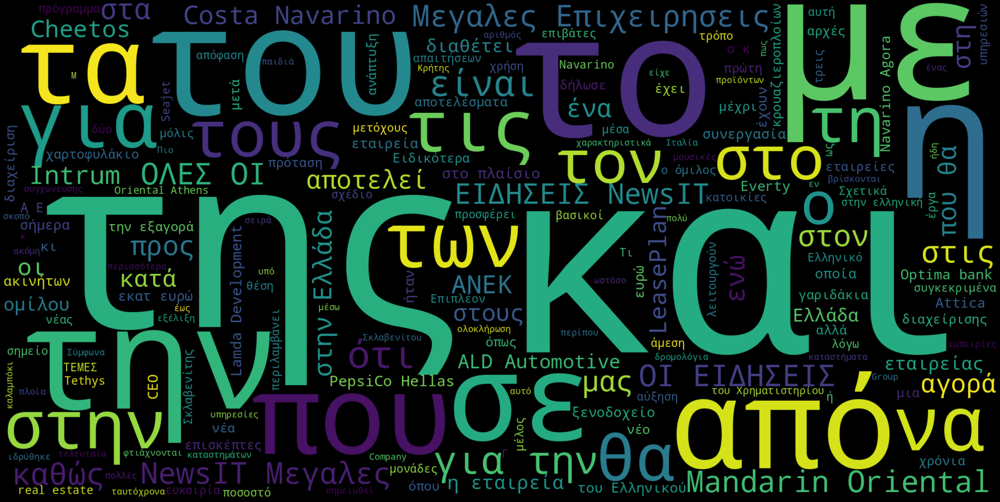

In [45]:
wordcloud = WordCloud(
#   stopwords = STOPWORDS,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [46]:
import spacy


In [47]:
nlp = spacy.load('el_core_news_sm')

In [48]:
list(nlp.Defaults.stop_words)[0:20]

['άλλη',
 'άλλοι',
 'ξαφνικά',
 'ανάμεσα',
 'αυτής',
 'στα',
 'κάποτε',
 'δικοί',
 'εκείνην',
 'αυτά',
 'εκείνα',
 'εκείνης',
 'ταύτος',
 'πάρα',
 'απέναντι',
 'άλλες',
 'μήδε',
 'αυτοί',
 'μόνο',
 'οποία']

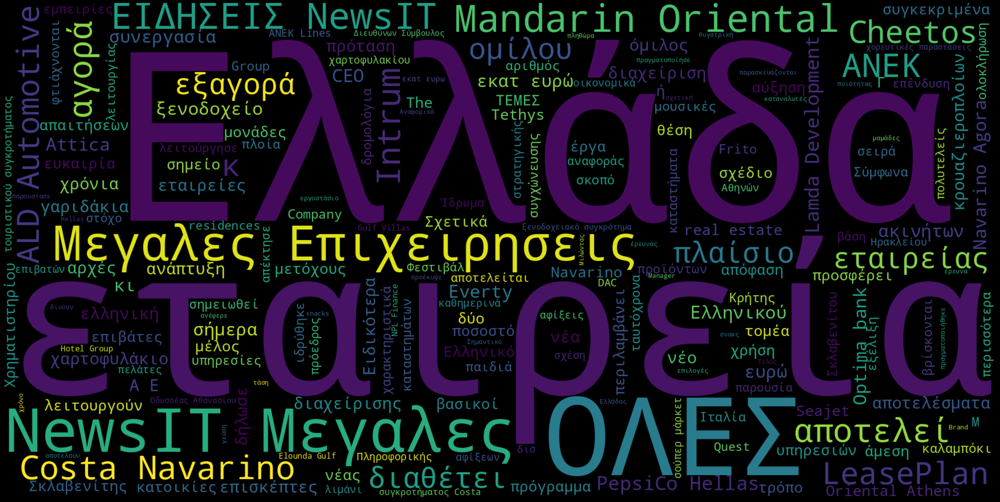

In [49]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [50]:
doc = nlp(short_newsit_df['full_text'][1])

In [51]:
for token in doc:
    print(token, token.lemma_)

NewsIT NewsIT
Μεγαλες Μεγαλεςς
Επιχειρησεις επιχειρησεις
Intracom Intracom
Defense Defense
: :
Επεκταση επεκταση
της ο
συνεργασιας συνεργασια
με με
Raytheon Raytheon
– –
Οι ο
οροι ορος
της ο
συμβασης συμβαση
18,2 18,2
εκατ. εκατ.
δολαριων δολαριων
Νέα νέος
σύμβαση σύμβαση
ύψους ύψος
18,2 18,2
εκατ. εκατ.
δολαρίων δολαρίων
για για
την ο
παραγωγή παραγωγή
κύριων κύριων
μονάδων μονάδα
του ο
συστήματος συστήματος
αεράμυνας αεράμυνας
   
Patriot Patriot
   
ανέθεσε αναθέτω
η ο
   
Intracom Intracom
   
Defense Defense
   
( (
IDE IDE
) )
στην σε ο
αμερικανική αμερικάνικος
εταιρία εταιρία
Raytheon Raytheon
, ,
που που
αφορά αφορώ
την ο
Η ο
εν εν
λόγω λόγος
σύμβαση σύμβαση
ενισχύει ενισχύω
τη ο
θέση θέση
της ο
Intracom Intracom
Defence Defence
ως ως
βασικό βασικός
προμηθευτή προμηθευτής
στην σε ο
παγκόσμια παγκόσμιος
αλυσίδα αλυσίδα
εφοδιασμού εφοδιασμός
της ο
Raytheon Raytheon
κι και
επιπλέον επιπλέον
αποτελεί αποτελώ
απόδειξη απόδειξη
της ο
μακροχρόνιας μακροχρόνια
συνεργασίας συνεργασία
τη

In [52]:
' '.join(token.lemma_ for token in doc)

'NewsIT Μεγαλεςς επιχειρησεις Intracom Defense : επεκταση ο συνεργασια με Raytheon – ο ορος ο συμβαση 18,2 εκατ. δολαριων νέος σύμβαση ύψος 18,2 εκατ. δολαρίων για ο παραγωγή κύριων μονάδα ο συστήματος αεράμυνας \xa0 Patriot \xa0 αναθέτω ο \xa0 Intracom \xa0 Defense \xa0 ( IDE ) σε ο αμερικάνικος εταιρία Raytheon , που αφορώ ο ο εν λόγος σύμβαση ενισχύω ο θέση ο Intracom Defence ως βασικός προμηθευτής σε ο παγκόσμιος αλυσίδα εφοδιασμός ο Raytheon και επιπλέον αποτελώ απόδειξη ο μακροχρόνια συνεργασία μου με ο Raytheon σε ο παραγωγή και υποστήριξη διεθνών πρόγραμμα Patriot .   Να σημειώνω , ότι ο IDE συγκαταλέγω σε ο επίσημος λίστα προμηθευτών οργανισμός ο NATO , συμμετέχω σε διεθνής πρόγραμμα και έχω επιτυγχάνω να ηγείται σε ευρωπαϊκός έργο χρηματοδοτούμενο από ο ευρωπαϊκός πρόγραμμα Βιομηχανικής ανάπτυξη σε ο τομέας ο άμυνα .   ΟΛΕΣ ΟΙ ΕΙΔΗΣΕΙΣ'

In [53]:
text

'NewsIT Μεγαλες Επιχειρησεις PepsiCo Hellas: Επενδυει στον τομεα των σνακς – Η ενημερωση για τα γαριδακια και τα σχεδια για την Cheetos Σημαντικό τομέα για την PepsiCo Hellas αποτελούν τα σνακς. Σε σχετική έρευνα που πραγματοποίησε η εταιρεία πρόσφατα, προέκυψε αυξημένη ζήτηση για τα γαριδάκια, που παρασκευάζονται με πρώτη ύλη το καλαμπόκι. Η καταναλωτική τάση αυξάνεται, λόγω της προσπάθειας που καταβάλει και η ίδια η εταιρεία PepsiCo Hellas για ενημέρωση του κοινού, μέσα από μια σειρά εκπαιδευτικών ενεργειών.  Στο πλαίσιο αυτό, με τη συμβολή της Braincandy, η εταιρεία πραγματοποίησε έρευνα τον Μάρτιο και Απρίλιο 2023, σε δείγμα 1.000 μαμάδων και τα συμπεράσματά της παρουσίασε η θυγατρική της πολυεθνικής σε πρόσφατη εκδήλωση. Αναφορικά με το περιεχόμενο της έρευνας, αφορούσε τα snacks και τις επιλογές των παιδιών τους μετά την πανδημία της covid-19 και όπως προέκυψε:  -Από μια πληθώρα προϊόντων που έχουν καταναλώσει τα παιδιά τον τελευταίο χρόνο (πατατάκια, μπισκότα, κρουασάν, γαριδάκι

In [54]:
full_doc = nlp(text)


In [55]:
clear_text = ' '.join(token.lemma_ for token in full_doc)

In [56]:
clear_text[200:400]

' έρευνα που πραγματοποιώ ο εταιρεία πρόσφατα , προέκυψε αυξημένος ζήτηση για ο γαριδάκι , που παρασκευάζονται με πρώτος ύλη ο καλαμπόκι . ο καταναλωτικός τάση αυξάνω , λόγω ο προσπάθεια που καταβάλλω '

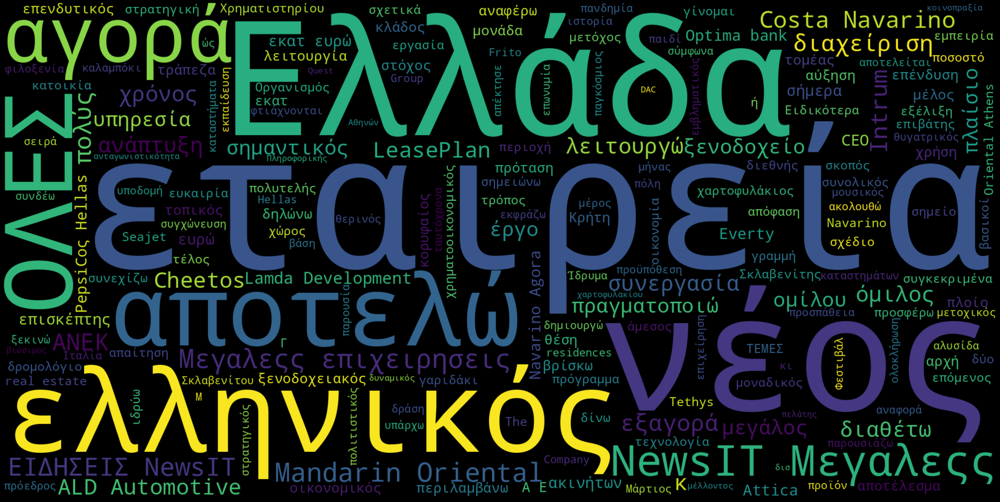

In [57]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(clear_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [58]:
#Δημιουργήστε γραφήματα ομαδοποιώντας μέσω του resample() την πολικότητα των άρθρων σας ανά ημέρα/μήνα/3μηνο/έτος ανάλογα με το θέμα.

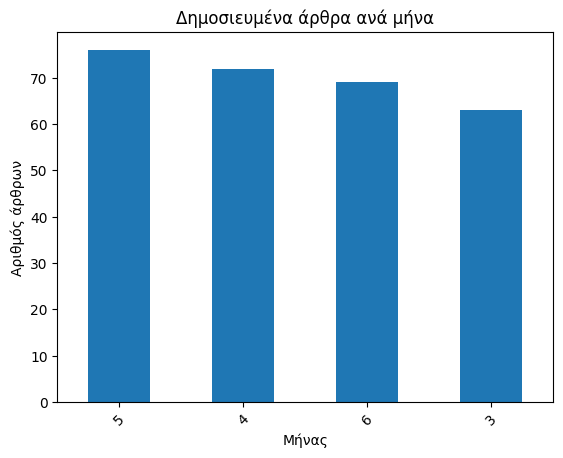

In [59]:

short_newsit_df['month'].value_counts().plot(kind='bar')

plt.title('Δημοσιευμένα άρθρα ανά μήνα')
plt.xlabel('Μήνας')
plt.ylabel('Αριθμός άρθρων')
plt.xticks(rotation=45)
plt.show()


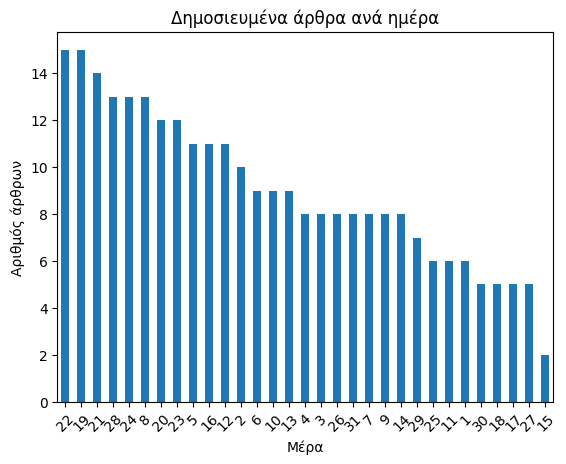

In [60]:
short_newsit_df['day'].value_counts().plot(kind='bar')

plt.title('Δημοσιευμένα άρθρα ανά ημέρα')
plt.xlabel('Μέρα')
plt.ylabel('Αριθμός άρθρων')
plt.xticks(rotation=45)
plt.show()


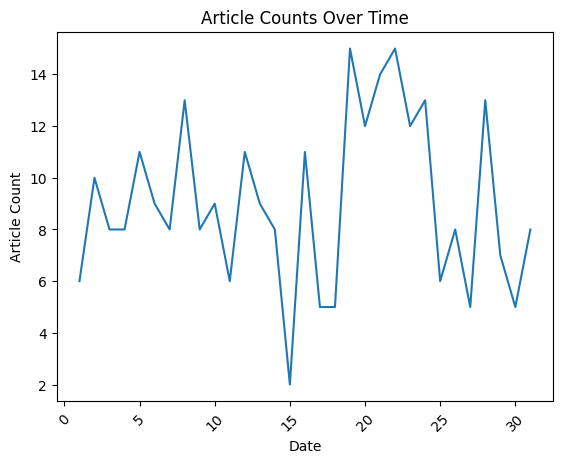

In [61]:
import matplotlib.pyplot as plt

article_counts = short_newsit_df.groupby('day').size()

plt.plot(article_counts.index, article_counts.values)

plt.title('Article Counts Over Time')
plt.xlabel('Date')
plt.ylabel('Article Count')
plt.xticks(rotation=45)
plt.show()


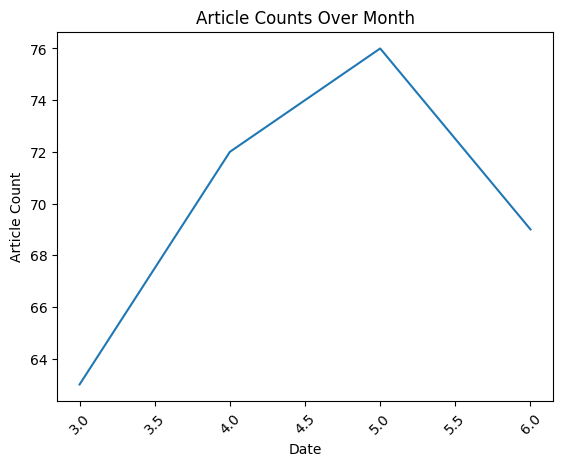

In [62]:
article_counts = short_newsit_df.groupby('month').size()

plt.plot(article_counts.index, article_counts.values)

plt.title('Article Counts Over Month')
plt.xlabel('Date')
plt.ylabel('Article Count')
plt.xticks(rotation=45)
plt.show()


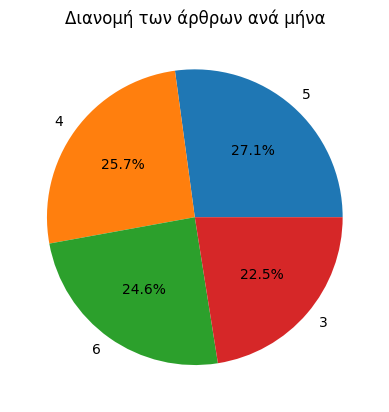

In [63]:
import matplotlib.pyplot as plt

month_counts = short_newsit_df['month'].value_counts()

# Plotting the pie chart
plt.pie(month_counts, labels=month_counts.index, autopct='%1.1f%%')

# Set the chart title
plt.title('Διανομή των άρθρων ανά μήνα')

# Display the chart
plt.show()


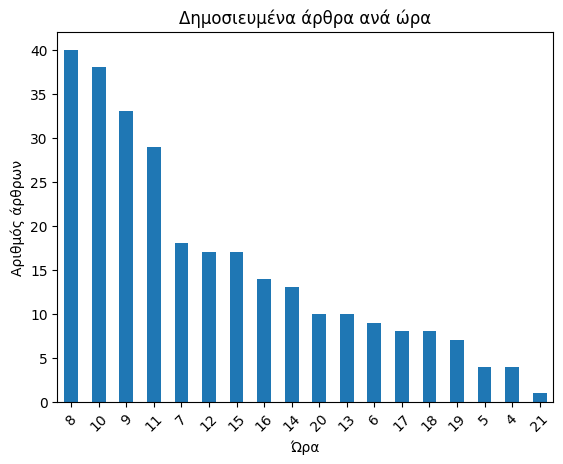

In [64]:
short_newsit_df['hour'].value_counts().plot(kind='bar')

plt.title('Δημοσιευμένα άρθρα ανά ώρα')
plt.xlabel('Ώρα')
plt.ylabel('Αριθμός άρθρων')
plt.xticks(rotation=45)
plt.show()


In [65]:
#Αξιοποιήστε την διανυσματοποίηση των κειμένων σας (CountVectorizer()), και τη χρήση της ομοιότητας κειμένων μέσω της συνάρτησης cosine_similarity() ώστε να βρείτε άρθρα που έχουν μεγάλη ομοιότητα. Παρουσιάστε τη συσχέτισηαυτή μέσω γραφήματος τύπου heatmap.

In [66]:
#Vectorization

In [67]:
from sklearn.feature_extraction.text import CountVectorizer


In [68]:

cv = CountVectorizer()

In [69]:
count_vector = cv.fit_transform(short_newsit_df['full_text'])

In [70]:
count_vector.shape


(280, 16232)

In [71]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())

results.head()

,00,000,000m2,0035,01,02,028,03,04,042,...,ύψιστης,ύψος,ύψους,ώθηση,ώρα,ώρες,ώριμες,ώριμη,ώρχους,ώστε
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [72]:
cv = CountVectorizer(stop_words= list(nlp.Defaults.stop_words))

In [73]:
count_vector = cv.fit_transform(short_newsit_df['full_text'])

In [74]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())

results.head()

,00,000,000m2,0035,01,02,028,03,04,042,...,ύψιστη,ύψιστης,ύψος,ύψους,ώθηση,ώρα,ώρες,ώριμες,ώριμη,ώρχους
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [75]:
cv = CountVectorizer(stop_words= list(nlp.Defaults.stop_words), min_df=0.01, max_df=0.95)

In [76]:
count_vector = cv.fit_transform(short_newsit_df['full_text'])


In [77]:

results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())

results.head()

,000,03,07,10,100,1000,105,106,107,11,...,όρων,όφελος,όχημα,ύλες,ύλη,ύπαρξης,ύψος,ύψους,ώρα,ώρες
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,1,0,0,2,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [78]:
cv = CountVectorizer( stop_words= list(nlp.Defaults.stop_words), max_features=20)
count_vector = cv.fit_transform(short_newsit_df['full_text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())
results.head()

,2022,2023,newsit,αγορά,ανάπτυξη,αποτελεί,αύξηση,ειδησεις,εκατ,ελλάδα,ενέργειας,επιχειρησεις,εταιρεία,εταιρείας,ευρώ,μεγαλες,νέα,ολες,ομίλου,όμιλος
0,0,0,1,1,1,0,1,1,0,0,0,1,1,2,0,1,0,1,0,0
1,0,0,1,0,0,1,0,1,2,0,0,1,0,0,0,1,1,1,0,0
2,1,1,1,0,0,0,0,1,0,0,1,1,3,1,0,1,0,1,0,0
3,0,0,1,0,0,1,0,1,0,2,0,1,4,2,1,1,1,1,1,0
4,1,0,1,3,0,0,0,1,0,2,0,1,2,2,0,1,1,1,0,3


In [79]:

cv = CountVectorizer( stop_words= list(nlp.Defaults.stop_words), max_features=20, ngram_range=(2, 2))
count_vector = cv.fit_transform(short_newsit_df['full_text'])
results2 = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())
results2.head()


,coca cola,lamda development,newsit μεγαλες,ανανεώσιμων πηγών,γεκ τερνα,διευθύνων σύμβουλος,δισ ευρώ,εκατ έναντι,εκατ ευρω,εκατ ευρώ,ελληνική αγορά,ηλεκτρικής ενέργειας,κέρδη φόρων,κύκλος εργασιών,μεγαλες επιχειρησεις,μετοχικού κεφαλαίου,ολες ειδησεις,τρίμηνο 2022,τρίμηνο 2023,φυσικού αερίου
0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
2,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
3,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0


In [80]:

results2.sum(axis =0).sort_values(ascending = False)

newsit μεγαλες          277
μεγαλες επιχειρησεις    277
ολες ειδησεις           257
εκατ ευρώ               229
διευθύνων σύμβουλος     105
εκατ ευρω                53
ηλεκτρικής ενέργειας     41
δισ ευρώ                 40
φυσικού αερίου           38
τρίμηνο 2023             38
μετοχικού κεφαλαίου      35
ελληνική αγορά           35
lamda development        34
τρίμηνο 2022             33
coca cola                33
κέρδη φόρων              27
κύκλος εργασιών          27
γεκ τερνα                26
εκατ έναντι              24
ανανεώσιμων πηγών        24
dtype: int64

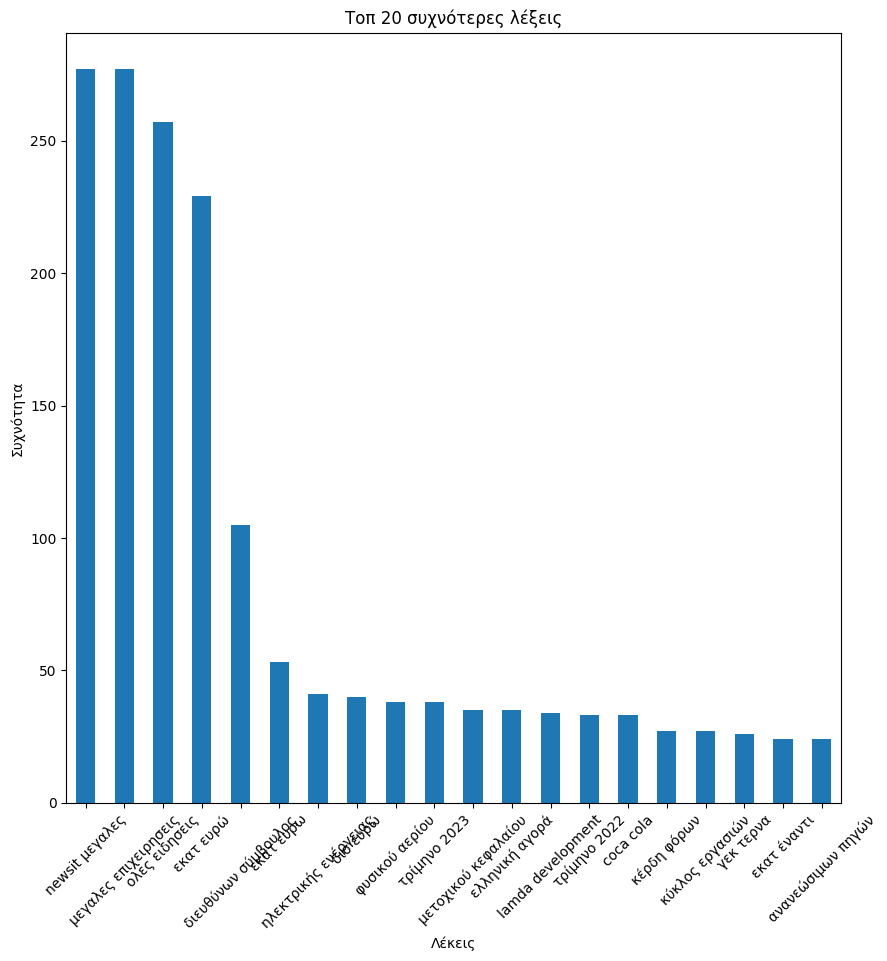

In [81]:
import matplotlib.pyplot as plt

# Compute the sum of each column and sort in descending order
word_frequencies =results2.sum(axis=0).sort_values(ascending=False)

# Select the top 10 most frequent words
top_20_words = word_frequencies.head(20)

# Plot the bar chart
plt.figure(figsize=(10, 10))
top_20_words.plot(kind='bar')
plt.xlabel('Λέκεις')
plt.ylabel('Συχνότητα')
plt.title('Τοπ 20 συχνότερες λέξεις')
plt.xticks(rotation=45)
plt.show()


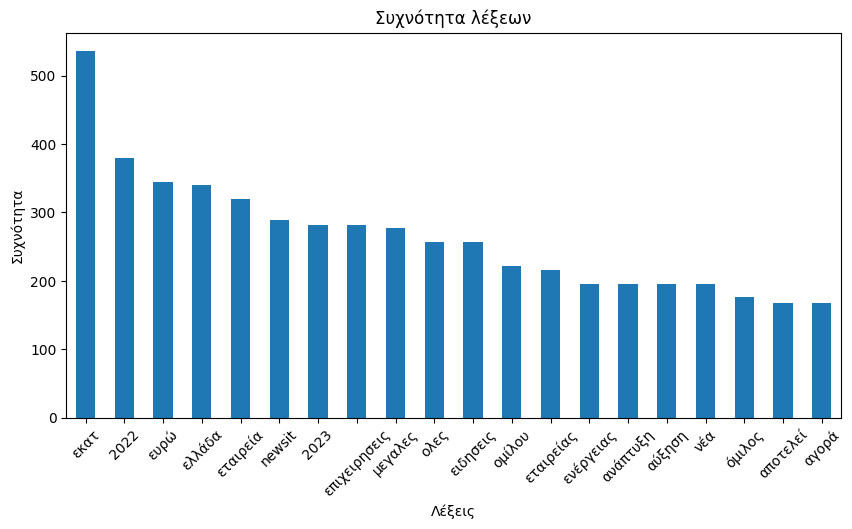

In [82]:
import matplotlib.pyplot as plt

# Compute the sum of each column and sort in descending order
word_frequencies = results.sum(axis=0).sort_values(ascending=False)

# Plot the bar chart
plt.figure(figsize=(10, 5))
word_frequencies.plot(kind='bar')
plt.xlabel('Λέξεις')
plt.ylabel('Συχνότητα')
plt.title('Συχνότητα λέξεων')
plt.xticks(rotation=45)
plt.show()


In [83]:
sum_words =  results.sum(axis =0)
sum_words.sort_values(ascending = False).head()


εκατ        536
2022        380
ευρώ        345
ελλάδα      340
εταιρεία    320
dtype: int64

In [84]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [85]:
tfidf_vectorizer = TfidfVectorizer(stop_words= list(nlp.Defaults.stop_words), max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(short_newsit_df['full_text'])

In [86]:
import spacy

# Load the pre-trained NER model
nlp = spacy.load("en_core_web_sm")

# Process the article text
article_text = "..."  # Replace with the actual article text
doc = nlp(article_text)

# Extract company names
results2 = [ent.text for ent in doc.ents if ent.label_ == "ORG"]

# Print the extracted company names
for company in results2:
    print(company)


Cosine similarity (ομοιότητα κειμένων)

In [87]:
from sklearn.metrics.pairwise import cosine_similarity

print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train[0:1], tfidf_matrix_train))

cosine scores ==>  [[1.         0.01638036 0.04812106 0.05566043 0.07026071 0.01692664
  0.02970012 0.03403538 0.1506392  0.05259712 0.06488728 0.2086583
  0.06025785 0.0685133  0.03465513 0.03399268 0.10673561 0.10528575
  0.07955137 0.04297712 0.08381585 0.14521265 0.15235572 0.03843136
  0.09411806 0.08612589 0.0861166  0.03297189 0.11771441 0.05374597
  0.13716551 0.06958959 0.15361118 0.10081159 0.03124448 0.08069797
  0.06706331 0.0511147  0.09841911 0.13717558 0.0329899  0.0267144
  0.06950547 0.07312488 0.0425534  0.10002715 0.0578951  0.03620749
  0.04801533 0.1444319  0.12631974 0.13766826 0.02181319 0.11954744
  0.05297545 0.11748558 0.13646781 0.01708423 0.04602538 0.06785745
  0.06391325 0.05078138 0.10388113 0.04531403 0.06699543 0.10530769
  0.0547655  0.04754611 0.05393149 0.07359367 0.06432943 0.01944982
  0.06871502 0.05677276 0.07864591 0.10039639 0.05795732 0.07048148
  0.07198041 0.05549523 0.07696849 0.07477439 0.13150216 0.12534897
  0.17709901 0.1480067  0.14993

In [88]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import spacy
from wordcloud import WordCloud
import seaborn as sns

In [89]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)


<Axes: >

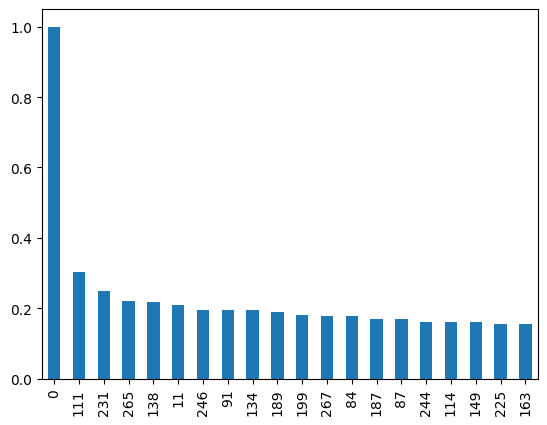

In [90]:
#ποια άρθρα μοιάζουν περισσότερο με το πρώτο
pd.DataFrame(arr).loc[0].sort_values(ascending = False).head(20).plot(kind = 'bar')

In [91]:
short_newsit_df['full_text'].loc[0]

'NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδικη τροχια η εναλλακτικη λυση στεγασης – Τα οφελη της συγκατοικησης απο τον ιδρυτη Δομινικο Πριτη Ταχεία ανάπτυξη καταγράφει η startup PropTech εταιρεία, MyRoomie, η οποία μέσα από προηγμένα κοινωνικά χαρακτηριστικά και τεχνολογικές βελτιώσεις παρέχει προσιτές και βιώσιμες λύσεις στέγασης και συγκατοίκησης σε όλη την Ευρώπη. Η καινοτόμος πλατφόρμα στέγασης MyRoomie δημιουργήθηκε, ως απάντηση στην αύξηση των τιμών των κατοικιών και των ενοικίων, που επικρατεί παγκοσμίως καθώς, όπως δήλωσε ο ιδρυτής και CEO της εταιρείας, Δομίνικος Πρίτης «Το MyRoomie προσφέρει μια μοναδική απάντηση στις προκλήσεις της οικονομικής προσιτότητας της στέγασης και της περιβαλλοντικής ευθύνης».  Η τελευταία έκδοση του MyRoomie εισάγει βελτιωμένες λειτουργίες κοινωνικής δικτύωσης, μια σημαντική προσθήκη που στοχεύει στην ενίσχυση της αίσθησης κοινότητας μεταξύ των χρηστών και στον εμπλουτισμό της κοινής εμπειρίας διαβίωσής τους. Ο προηγμένος αλγόριθμος αντιστοίχιση

In [92]:
short_newsit_df['full_text'].loc[8]

'NewsIT Τεχνολογια Η καινοτομια στην καρδια της MYTILINEOS Μια νέα και φιλόδοξη technology startup, η Avokado, συστήθηκε στο ελληνικό και διεθνές κοινό την Τετάρτη 21 Ιουνίου, στα γραφεία της Mytilineos, σκοπός της οποίας είναι να παρέχει λύσεις προσαρμοσμένες στις ανάγκες της παγκόσμιας έξυπνης αγοράς ενέργειας. Όπως ανέφεραν οι εκπρόσωποι της εταιρείας μιλώντας σε εκπροσώπους του Τύπου, η υιοθέτηση νέων τεχνολογικών λύσεων και ιδιαίτερα της Τεχνητής Νοημοσύνης (ΤΝ) είναι αναγκαία συνθήκη για την υλοποίηση της «πράσινης» ενεργειακής μετάβασης. Καθώς, όμως, η παγκόσμια προσφορά είναι περιορισμένη σε σχέση με την ζήτηση που υπάρχει, η Avokado επιδιώκει να καλύψει αυτό το κενό.  Συνδυάζοντας ΑΙ, data Intelligence και νέες τεχνολογίες, όπως Internet of Energy, Mobile, Social, Blockchain, αναμορφώνει τον τρόπο με τον οποία αντιλαμβανόμαστε την παροχή ενέργειας και κτίζει «έξυπνες πόλεις» για «έξυπνους πολίτες». Ο Γιάννης Καλαφατάς, Chief Executive Director του Κλάδου Ενέργειας της Mytiline

In [93]:
arr = cosine_similarity(tfidf_matrix_train[0:10], tfidf_matrix_train[0:10])

<Axes: title={'center': 'Βαθμός ομοιότητας των 20 πρώτων άρθρων'}>

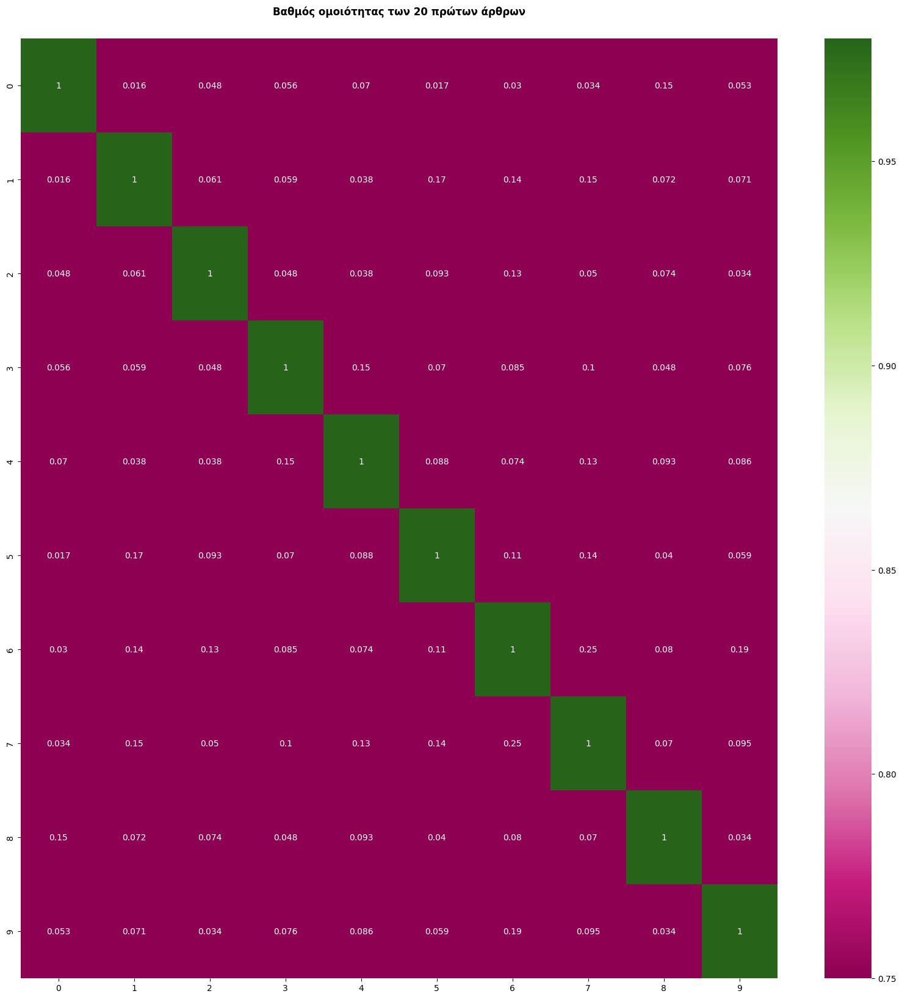

In [94]:
plt.figure(figsize=(20, 20))
# annot = True to print the values inside the square
plt.title('Βαθμός ομοιότητας των 20 πρώτων άρθρων', y=1.02, fontweight='bold') # το y ορίζει την απόσταση του τίτλου από το γράφημα
sns.heatmap(data=arr, annot=True, vmin=0.75, vmax=0.98, cmap="PiYG")

#plt.savefig('<το path και το όνομα του αρχείου>.png')

In [95]:
 #Κάνοντας χρήση του ελληνικού λεξικού για sentiment anaysis του NRC βρείτε την πολικότητα (θετική - αρνητική) και τα συναισθήματα των κειμένων σας, και αποθηκεύστε τα σε νέες στήλες στο dataframe των δεδομένων σας.

In [96]:
filepath = "https://raw.githubusercontent.com/datajour-gr/Data_journalism/master/week9/NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt"
emolex_df = pd.read_csv(filepath,  names=["word", "emotion", "association"], skiprows=45, sep='\t')
emolex_df.head()

,word,emotion,association
0,aback,anger,0
1,aback,anticipation,0
2,aback,disgust,0
3,aback,fear,0
4,aback,joy,0


In [97]:
emolex_df.emotion.unique()

array(['anger', 'anticipation', 'disgust', 'fear', 'joy', 'negative',
       'positive', 'sadness', 'surprise', 'trust'], dtype=object)

In [98]:
emolex_df[emolex_df.association == 1].emotion.value_counts()

negative        3324
positive        2312
fear            1476
anger           1247
trust           1231
sadness         1191
disgust         1058
anticipation     839
joy              689
surprise         534
Name: emotion, dtype: int64

In [99]:
emolex_df[(emolex_df.association == 1) & (emolex_df.emotion == 'anger')].word

30          abandoned
40        abandonment
170             abhor
180         abhorrent
270           abolish
             ...     
141220       wrongful
141230        wrongly
141470           yell
141500           yelp
141640          youth
Name: word, Length: 1247, dtype: object

In [100]:
emolex_words = emolex_df.pivot(index='word', columns='emotion', values='association').reset_index()
emolex_words.head()

emotion,word,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust
0,NaN,0,0,0,0,0,0,0,0,0,0
1,aback,0,0,0,0,0,0,0,0,0,0
2,abacus,0,0,0,0,0,0,0,0,0,1
3,abandon,0,0,0,1,0,1,0,1,0,0
4,abandoned,1,0,0,1,0,1,0,1,0,0


In [101]:
emolex_words[emolex_words.word == 'charitable']

emotion,word,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust
2002,charitable,0,1,0,0,1,0,1,0,0,1


In [102]:
emolex_words[emolex_words.anger == 1].head()

emotion,word,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust
4,abandoned,1,0,0,1,0,1,0,1,0,0
5,abandonment,1,0,0,1,0,1,0,1,1,0
18,abhor,1,0,1,1,0,1,0,0,0,0
19,abhorrent,1,0,1,1,0,1,0,0,0,0
28,abolish,1,0,0,0,0,1,0,0,0,0


In [103]:
emolex_words[(emolex_words.joy == 1) & (emolex_words.negative == 1)].head()

emotion,word,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust
62,abundance,0,1,1,0,1,1,1,0,0,1
1019,balm,0,1,0,0,1,1,1,0,0,0
1383,boisterous,1,1,0,0,1,1,1,0,0,0
1917,celebrity,1,1,1,0,1,1,1,0,1,1
2005,charmed,0,0,0,0,1,1,1,0,0,0


In [104]:
emolex_words[emolex_words.anger == 1].word

4          abandoned
5        abandonment
18             abhor
19         abhorrent
28           abolish
            ...     
14122       wrongful
14123        wrongly
14147           yell
14150           yelp
14164          youth
Name: word, Length: 1247, dtype: object

In [105]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import glob
import time
import os
import ast
from datetime import datetime
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import numpy as np

import itertools
import re


import nltk
from nltk.corpus import stopwords

In [106]:
df = newsit_full_articles_df

In [107]:
df.columns

Index(['site', 'url', 'title', 'date', 'author', 'full_text', 'clean_text',
       'datetime'],
      dtype='object')

In [108]:
print("Number of articles scraped (before cleaning): ", df.shape[0])

Number of articles scraped (before cleaning):  280


In [109]:
df.dtypes


site                       object
url                        object
title                      object
date          datetime64[ns, UTC]
author                     object
full_text                  object
clean_text                 object
datetime                   object
dtype: object

In [110]:
df.drop_duplicates(inplace=True)

In [111]:
df = df.reset_index(drop=True)

In [112]:
df.shape

(280, 8)

In [113]:
df['author'].value_counts().head(10)

newsit.gr    280
Name: author, dtype: int64

<Axes: >

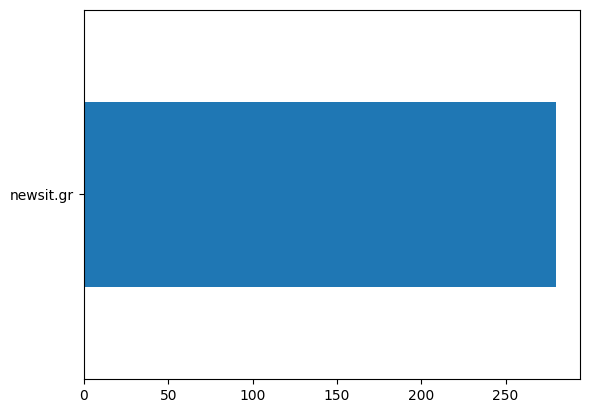

In [114]:
df['author'].value_counts().head(10).sort_values().plot(kind='barh')

In [115]:
df = df.replace(np.nan, '0')

In [116]:
df[df.full_text.isnull()].shape

(0, 8)

In [117]:
df['date'] =  pd.to_datetime(df['date'] )

In [118]:
df.dtypes

site                       object
url                        object
title                      object
date          datetime64[ns, UTC]
author                     object
full_text                  object
clean_text                 object
datetime                   object
dtype: object

In [119]:
df.rename(columns={'full_text': 'body'}, inplace=True)

In [120]:
import string
def clean_text(article):
    clean1 = re.sub(r'['+string.punctuation + '’—”'+']', "", article.lower())
    return re.sub(r'\W+', ' ', clean1)

In [121]:
df['tokenized'] = df['body'].map(lambda x: clean_text(x))

In [122]:
df.body = [str (item) for item in df['body']]

In [123]:
df['tokenized'] = df['body'].map(lambda x: clean_text(x))

Πόσες λέξεις υπάρχουν στα άρθρα

In [124]:
df['num_wds'] = df['tokenized'].apply(lambda x: len(x.split()))
df['num_wds'].mean()

428.21785714285716

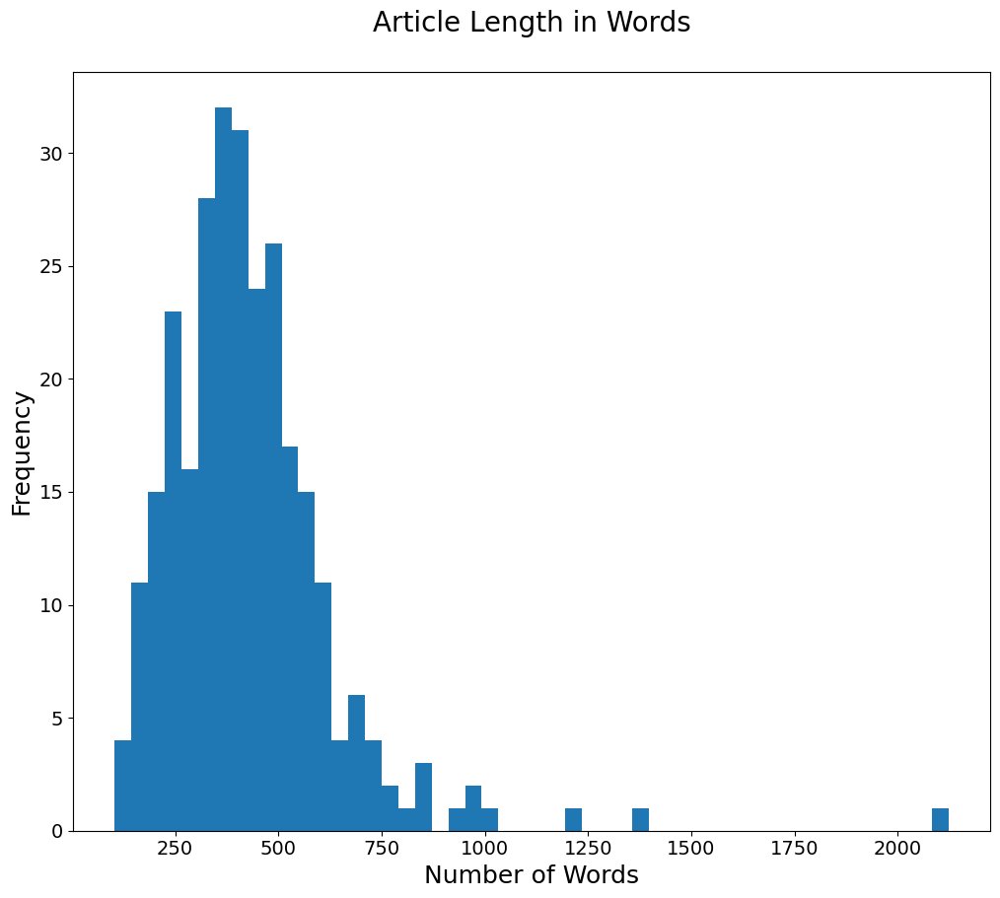

In [125]:
ax=df['num_wds'].plot(kind='hist', bins=50, fontsize=14, figsize=(12,10))
ax.set_title('Article Length in Words\n', fontsize=20)
ax.set_ylabel('Frequency', fontsize=18)
ax.set_xlabel('Number of Words', fontsize=18);

In [126]:
df['uniq_wds'] = df['tokenized'].str.split().apply(lambda x: len(set(x)))
df['uniq_wds'].head()

0    191
1     89
2    277
3    164
4    280
Name: uniq_wds, dtype: int64

In [127]:
df['uniq_wds'].mean()

241.71785714285716

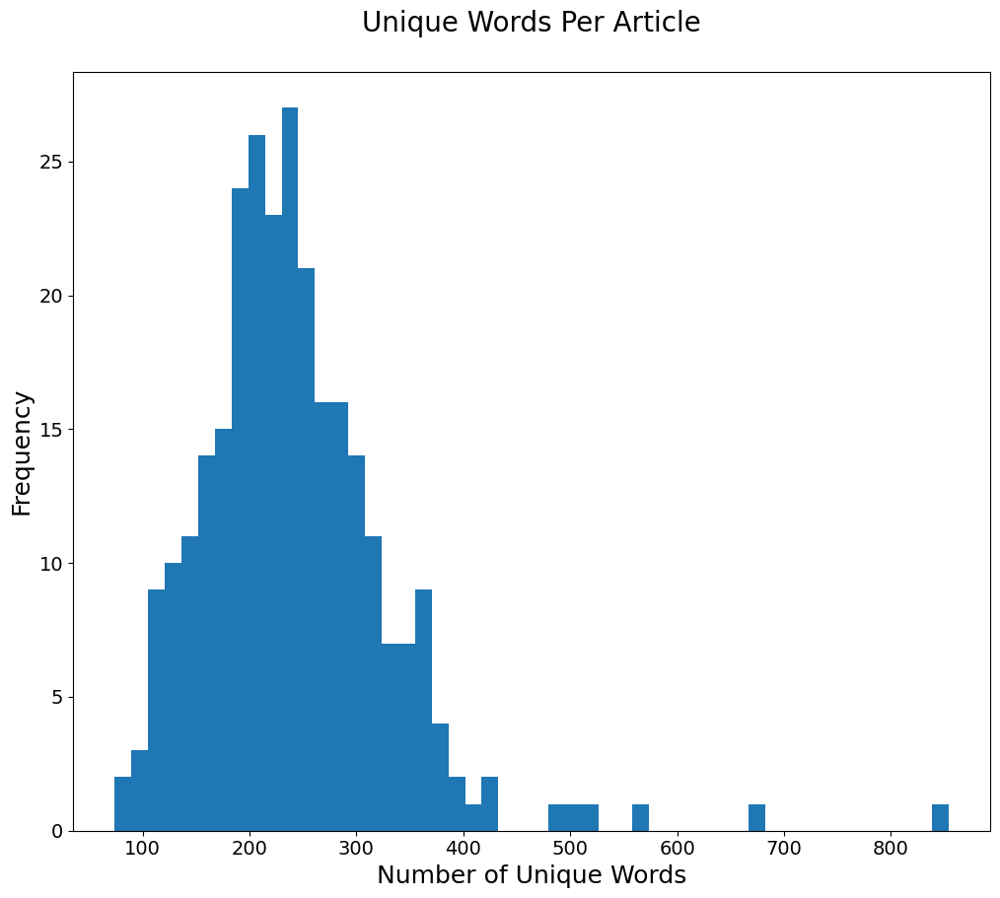

In [128]:
ax=df['uniq_wds'].plot(kind='hist', bins=50, fontsize=14, figsize=(12,10))
ax.set_title('Unique Words Per Article\n', fontsize=20)
ax.set_ylabel('Frequency', fontsize=18)
ax.set_xlabel('Number of Unique Words', fontsize=18);

In [129]:
from collections import Counter

wd_counts = Counter()
for i, row in df.iterrows():
    wd_counts.update(row['tokenized'].split())

In [130]:
import nltk
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [131]:
from nltk.corpus import stopwords

stopwords = set(stopwords.words('english'))

# Your code for removing stopwords
for sw in stopwords:
    del wd_counts[sw]


In [132]:
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))

# Your code for removing stopwords
for sw in stop_words:
    del wd_counts[sw]


In [133]:
for sw in stopwords.words('english'):
    del wd_counts[sw]

In [134]:
wd_counts.most_common(20)

[('και', 4365),
 ('της', 3375),
 ('το', 2652),
 ('του', 2591),
 ('την', 2528),
 ('η', 2325),
 ('με', 2053),
 ('για', 1637),
 ('σε', 1625),
 ('των', 1466),
 ('στην', 1383),
 ('που', 1369),
 ('από', 1340),
 ('να', 1246),
 ('τα', 1077),
 ('τη', 991),
 ('ο', 947),
 ('οι', 883),
 ('στο', 815),
 ('θα', 733)]

In [135]:
from nltk.stem import PorterStemmer
st = PorterStemmer()
df['tokenized'].apply(lambda x: " ".join([st.stem(word) for word in x.split()]))

0      newsit μεγαλες επιχειρησεις myroomi σε ανοδικη...
1      newsit μεγαλες επιχειρησεις intracom defens επ...
2      newsit μεγαλες επιχειρησεις pepsico hella επεν...
3      newsit μεγαλες επιχειρησεις σκλαβενιτης εισερχ...
4      newsit μεγαλες επιχειρησεις ανεκ line αλλαγη π...
                             ...                        
275    newsit μεγαλες επιχειρησεις tupperwar ξαφνικο ...
276    newsit μεγαλες επιχειρησεις jumbo στα 949 εκατ...
277    newsit μεγαλες επιχειρησεις landisgyr προσφευγ...
278    newsit μεγαλες επιχειρησεις frigoglass στις 28...
279    newsit μεγαλες επιχειρησεις epsilon net αυξηση...
Name: tokenized, Length: 280, dtype: object

In [136]:
import nltk


In [137]:
import pandas as pd
%matplotlib inline
import numpy as np
import glob
from sklearn.feature_extraction.text import CountVectorizer
from datetime import datetime

λεξικό VADER

In [138]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [139]:
df.head(1)

,site,url,title,date,author,body,clean_text,datetime,tokenized,num_wds,uniq_wds
0,newsit.gr,https://www.newsit.gr/megales-epixeiriseis/MyR...,MyRoomie: Σε ανοδική τροχιά η εναλλακτική λύση...,2023-06-26 13:50:46+00:00,newsit.gr,NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδι...,NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδι...,2023-06-26 16:50:46+03:00,newsit μεγαλες επιχειρησεις myroomie σε ανοδικ...,274,191


In [140]:
filepath = "https://raw.githubusercontent.com/datajour-gr/DataJournalism/main/Bachelor%20Lessons%202023/Lesson%2010/NRC_GREEK_Translated_6_2020.csv"

In [141]:
emolex_df = pd.read_csv(filepath)
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [142]:
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(inplace = True, drop=True)

In [143]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13157,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13158,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13159,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13160,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [144]:
import spacy

In [145]:
nlp = spacy.load('el_core_news_sm')

In [146]:
len(df)

280

In [147]:
df_shorted = newsit_full_articles_df[['date', 'full_text']]

In [148]:
df_shorted.tail()

,date,full_text
275,2023-03-08 12:29:17+00:00,NewsIT Μεγαλες Επιχειρησεις Tupperware: Ξαφνικ...
276,2023-03-08 11:31:09+00:00,NewsIT Μεγαλες Επιχειρησεις Jumbo: Στα 949 εκα...
277,2023-03-08 10:57:09+00:00,NewsIT Μεγαλες Επιχειρησεις Landis+Gyr: Προσφε...
278,2023-03-08 09:31:12+00:00,NewsIT Μεγαλες Επιχειρησεις Frigoglass: Στις 2...
279,2023-03-07 13:01:01+00:00,NewsIT Μεγαλες Επιχειρησεις Epsilon Net: Αυξησ...


In [149]:
df_shorted.dtypes

date         datetime64[ns, UTC]
full_text                 object
dtype: object

In [150]:
emolex_df['word'].head(3)

0              αφεση
1    ενορκη βεβαιωση
2            εχοντας
Name: word, dtype: object

In [151]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word,
                      lowercase=False,
                      strip_accents = 'unicode',
                      stop_words= list(nlp.Defaults.stop_words),
                      ngram_range=(1, 2))

In [152]:
matrix = vec.fit_transform(df_shorted['full_text'])
vocab = vec.get_feature_names_out()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:409: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια', 'βεβαιοτατα', 'γιατι', 'γρηγορα', 'γυρω', 'δεινα', 'δεξια', 'δηθεν', 'δηλαδη', 'διαρκως', 'δικα', 'δικο', 'δικοι', 'δικος', 'δικου', 'δικους', 'διολου', 'διπλα', 'διχως', 'εαν', 'εαυτο', 'εαυτον', 'εαυτου', 'εαυτους', 'εαυτων', 'εγιναν', 'εγινε',

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [153]:
wordcount_df.shape

(280, 13161)

In [154]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [155]:

emolex_df[emolex_df.Anger == 1].tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13094,διεξοδος,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13096,ζωυφια,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
13100,θυματοποιω,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
13128,αποτυχημενος,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [156]:
# Φτιάξε μια λίστα με positive words
positive_words = emolex_df[emolex_df.Positive == 1]['word']

# Φτιάξε μια λίστα με negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']

# Φτιάξε μια λίστα με anger words
angry_words = emolex_df[emolex_df.Anger == 1]['word']

# Φτιάξε μια λίστα με anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']

# Φτιάξε μια λίστα με disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']

# Φτιάξε μια λίστα με fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']

# Φτιάξε μια λίστα με joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']

# Φτιάξε μια λίστα με sadness words
sadness_words = emolex_df[emolex_df.Sadness == 1]['word']

# Φτιάξε μια λίστα με surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']

# Φτιάξε μια λίστα με trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']

In [157]:
trust_words

8                        αμην
15             γαμηλιο ταξιδι
24       διευθυντρια σχολειου
38                 επικοινωνω
45                   εκκλησια
                 ...         
13039                  αληθης
13075             αναμφιβολως
13079             ανυπερβατος
13113            αναθηματικος
13114       αποδειξη πληρωμης
Name: word, Length: 1259, dtype: object

In [158]:
wordcount_df.tail(1)

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
279,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [159]:
wordcount_df[trust_words].tail(1)

,αμην,γαμηλιο ταξιδι,διευθυντρια σχολειου,επικοινωνω,εκκλησια,εν τω μεταξυ,ευαγγελιο,κυριε,λιστα ελεγχου,λυρικη σκηνη,...,ηλιακο ωρολογιο,συνεργιστικος,διπλο ποδηλατο,ισαξιος,ανακωχη,αληθης,αναμφιβολως,ανυπερβατος,αναθηματικος,αποδειξη πληρωμης
279,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [160]:
wordcount_df[trust_words].sum(axis=1)

0       4
1       3
2      10
3      10
4       4
       ..
275     7
276    16
277    12
278    13
279     5
Length: 280, dtype: int64

In [161]:
df_shorted['anger'] = wordcount_df[angry_words].sum(axis=1)
df_shorted['positive'] = wordcount_df[positive_words].sum(axis=1)

df_shorted['joy'] = wordcount_df[joy_words].sum(axis=1)

df_shorted['disgust'] = wordcount_df[disgust_words].sum(axis=1)

df_shorted['surprise'] = wordcount_df[surprise_words].sum(axis=1)

df_shorted['trust'] = wordcount_df[trust_words].sum(axis=1)

df_shorted['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)
df_shorted['sadness'] = wordcount_df[sadness_words].sum(axis=1)

df_shorted['negative'] = wordcount_df[negative_words].sum(axis=1)

df_shorted['fear'] = wordcount_df[fear_words].sum(axis=1)

<ipython-input-161-3ab8bbec584d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_shorted['anger'] = wordcount_df[angry_words].sum(axis=1)
<ipython-input-161-3ab8bbec584d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_shorted['positive'] = wordcount_df[positive_words].sum(axis=1)
<ipython-input-161-3ab8bbec584d>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation:

In [162]:
df_shorted

,date,full_text,anger,positive,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
0,2023-06-26 13:50:46+00:00,NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδι...,0,7,1,2,0,4,2,1,2,1
1,2023-06-26 11:26:47+00:00,NewsIT Μεγαλες Επιχειρησεις Intracom Defense: ...,0,5,0,1,0,3,2,0,2,2
2,2023-06-23 12:59:49+00:00,NewsIT Μεγαλες Επιχειρησεις PepsiCo Hellas: Επ...,4,17,4,2,2,10,12,3,8,4
3,2023-06-23 11:40:13+00:00,NewsIT Μεγαλες Επιχειρησεις Σκλαβενιτης – Εισε...,0,17,0,0,1,10,3,2,2,1
4,2023-06-23 10:12:50+00:00,NewsIT Μεγαλες Επιχειρησεις ΑΝΕΚ Lines: Αλλαγη...,5,24,5,6,3,4,13,7,12,8
...,...,...,...,...,...,...,...,...,...,...,...,...
275,2023-03-08 12:29:17+00:00,NewsIT Μεγαλες Επιχειρησεις Tupperware: Ξαφνικ...,5,10,3,6,2,7,9,8,16,7
276,2023-03-08 11:31:09+00:00,NewsIT Μεγαλες Επιχειρησεις Jumbo: Στα 949 εκα...,4,9,4,3,3,16,4,5,6,5
277,2023-03-08 10:57:09+00:00,NewsIT Μεγαλες Επιχειρησεις Landis+Gyr: Προσφε...,2,19,3,2,3,12,4,1,4,5
278,2023-03-08 09:31:12+00:00,NewsIT Μεγαλες Επιχειρησεις Frigoglass: Στις 2...,5,15,4,1,2,13,7,6,9,7


In [163]:
df_shorted.reset_index(inplace=True)
df_shorted.set_index('date', inplace=True)
df_shorted

,index,full_text,anger,positive,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
date,,,,,,,,,,,,
2023-06-26 13:50:46+00:00,0,NewsIT Μεγαλες Επιχειρησεις MyRoomie: Σε ανοδι...,0,7,1,2,0,4,2,1,2,1
2023-06-26 11:26:47+00:00,1,NewsIT Μεγαλες Επιχειρησεις Intracom Defense: ...,0,5,0,1,0,3,2,0,2,2
2023-06-23 12:59:49+00:00,2,NewsIT Μεγαλες Επιχειρησεις PepsiCo Hellas: Επ...,4,17,4,2,2,10,12,3,8,4
2023-06-23 11:40:13+00:00,3,NewsIT Μεγαλες Επιχειρησεις Σκλαβενιτης – Εισε...,0,17,0,0,1,10,3,2,2,1
2023-06-23 10:12:50+00:00,4,NewsIT Μεγαλες Επιχειρησεις ΑΝΕΚ Lines: Αλλαγη...,5,24,5,6,3,4,13,7,12,8
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-08 12:29:17+00:00,275,NewsIT Μεγαλες Επιχειρησεις Tupperware: Ξαφνικ...,5,10,3,6,2,7,9,8,16,7
2023-03-08 11:31:09+00:00,276,NewsIT Μεγαλες Επιχειρησεις Jumbo: Στα 949 εκα...,4,9,4,3,3,16,4,5,6,5
2023-03-08 10:57:09+00:00,277,NewsIT Μεγαλες Επιχειρησεις Landis+Gyr: Προσφε...,2,19,3,2,3,12,4,1,4,5


<Axes: xlabel='date'>

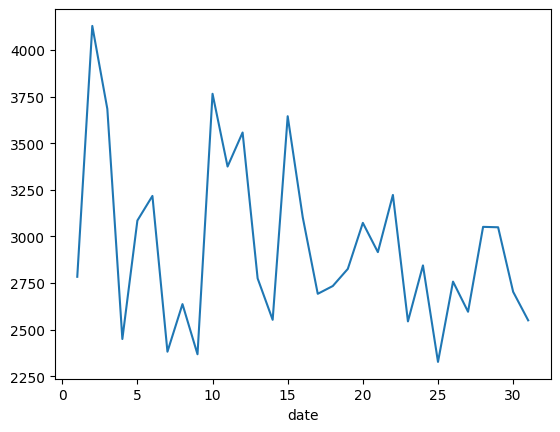

In [164]:
df_shorted['full_text'].str.len().groupby(by=df_shorted.index.day).mean().plot()

<Axes: xlabel='date'>

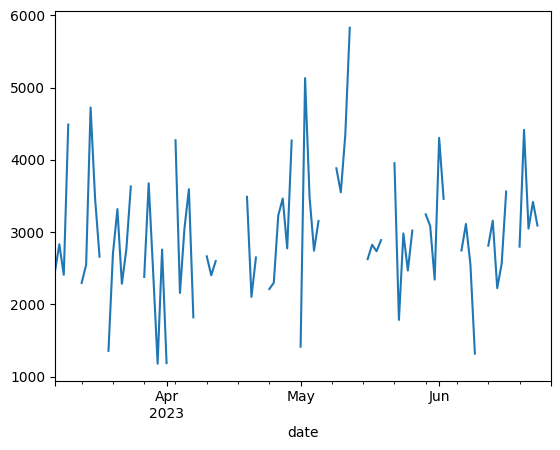

In [165]:
df_shorted['full_text'].str.len().resample('D').mean().plot()


Μετράμε τη θετικότητα/αρνητικότητα και το συναισθηματικό πρόσιμο των άρθρων ανά ημέρα

<Axes: xlabel='date'>

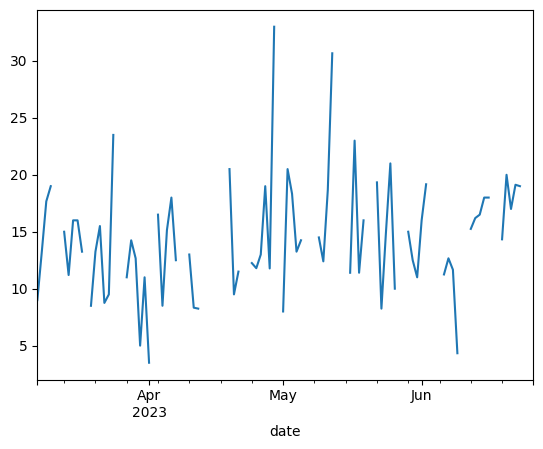

In [166]:
df_shorted['positive'].resample('D').mean().plot()

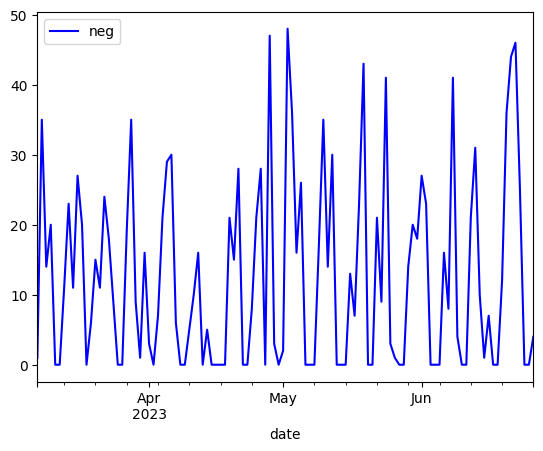

In [167]:
df_shorted['negative'].resample('D').sum().plot(color = 'b',label = 'neg').legend()

<Axes: xlabel='date'>

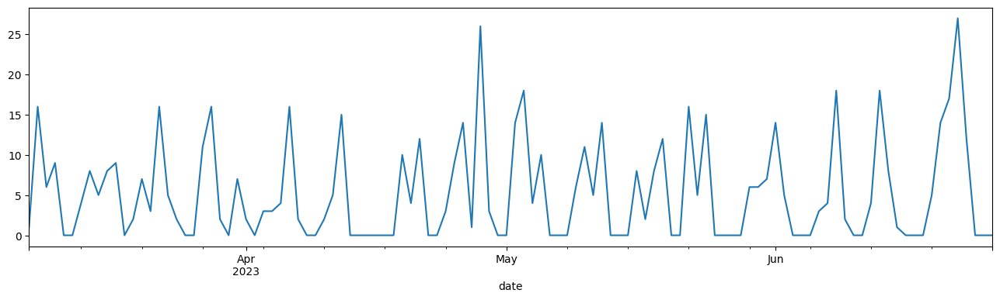

In [168]:
df_shorted['anger'].resample('D').sum().plot(figsize=(16,4))

<Axes: xlabel='date'>

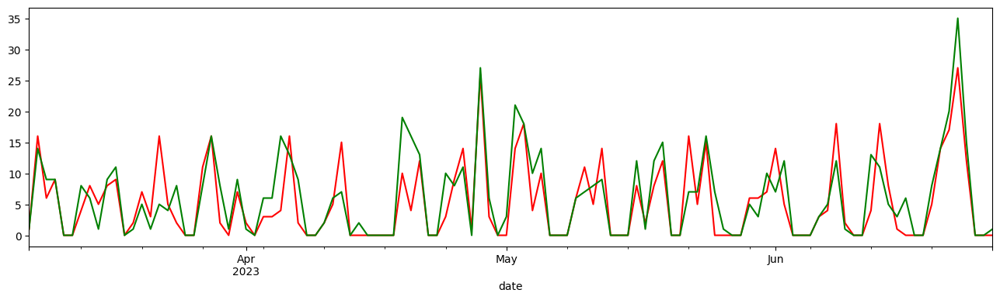

In [169]:
ax = df_shorted['anger'].resample('D').sum().plot(figsize=(16,4), color = 'red')
df_shorted['joy'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'green')

<Axes: xlabel='date'>

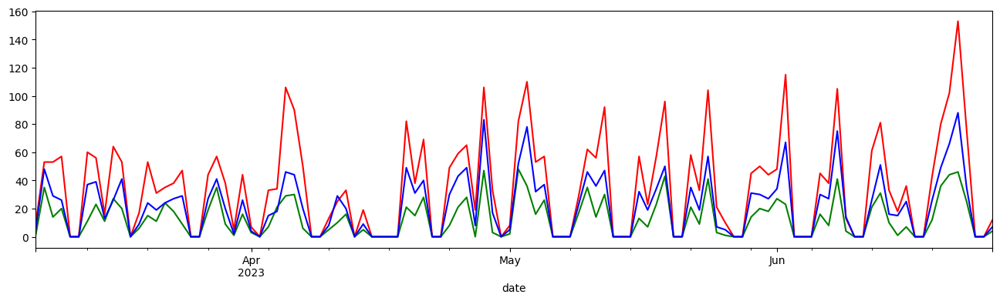

In [170]:
ax = df_shorted['positive'].resample('D').sum().plot(figsize=(16,4), color = 'red')
df_shorted['negative'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'green')
df_shorted['trust'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'blue')

In [171]:
import matplotlib.pyplot as plt
plt.style.use('default')

In [172]:
#plt.style.use('classic')
#plt.style.use('ggplot')
plt.style.use('Solarize_Light2')
#plt.style.use('seaborn-v0_8-bright')

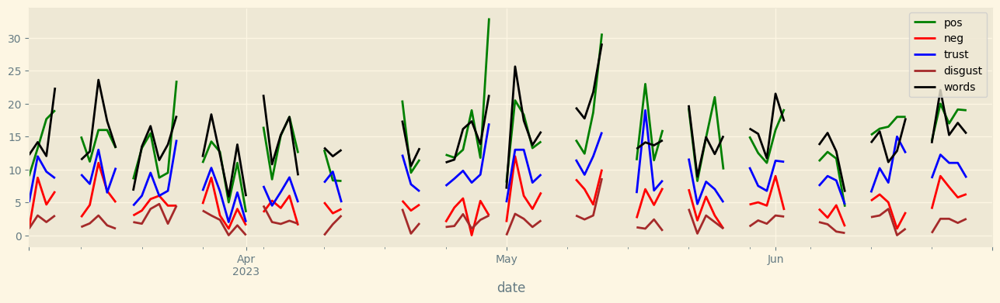

In [173]:
ax = df_shorted['positive'].resample('D').mean().plot(figsize=(16,4),
                                                          color = 'g', label='pos')
df_shorted['negative'].resample('D').mean().plot(figsize=(16,4), ax = ax,
                                                   label = 'neg', color = 'r')
df_shorted['trust'].resample('D').mean().plot(figsize=(16,4), ax = ax,
                                                label = 'trust',color = 'blue').legend()
df_shorted['disgust'].resample('D').mean().plot(figsize=(16,4), ax = ax,
                                                label = 'disgust',color = 'brown').legend()
(df_shorted['full_text'].str.len().resample('D').mean()/200).plot(figsize=(16,4), ax = ax, # διαιρώ το mean των λέξεων με το 200 για να πλησιάσει στην κλίμακα τα άλλα
                                                label = 'words',color = 'black').legend()

In [174]:
#plt.style.use('grayscale')
plt.style.use('seaborn-v0_8-darkgrid')

<Axes: xlabel='date'>

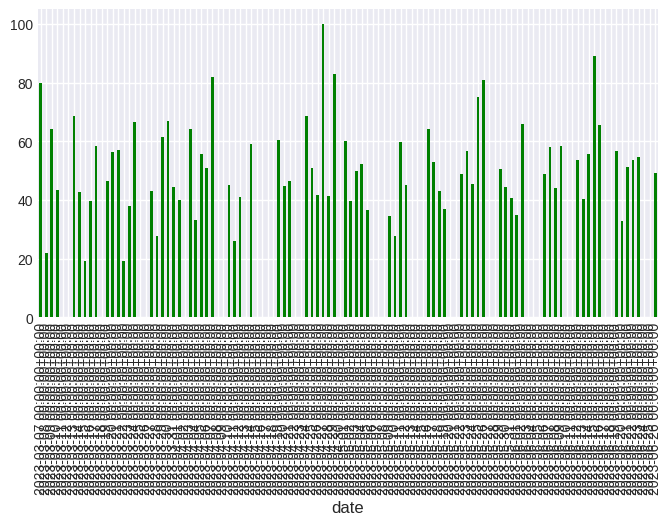

In [175]:
df_shorted['(-)αρνητικότητα | θετικότητα(+)'] = df_shorted.positive*100//df_shorted[['positive','negative']].sum(
        axis=1) - df_shorted.negative*100//df_shorted[['positive','negative']].sum(axis=1)

df_shorted['(-)αρνητικότητα | θετικότητα(+)'].resample('D').mean().plot(kind='bar',
                                                                               color=(df_shorted['(-)αρνητικότητα | θετικότητα(+)'].resample('D').mean()>0
                                                                               ).map({True: 'g', False: 'r'}), figsize=(8,4))

In [176]:
#Ας εντοπίσουμε το άρθρο με τη μεγαλύτερη θετικότητα και το άρθρο με τη μεγαλύτερη αρνητικότητα

In [177]:
df_shorted[(df_shorted['(-)αρνητικότητα | θετικότητα(+)'] == df_shorted['(-)αρνητικότητα | θετικότητα(+)'].max()) |
                  (df_shorted['(-)αρνητικότητα | θετικότητα(+)'] == df_shorted['(-)αρνητικότητα | θετικότητα(+)'].min())
                  ][['index', 'positive', 'negative', '(-)αρνητικότητα | θετικότητα(+)']]

,index,positive,negative,(-)αρνητικότητα | θετικότητα(+)
date,,,,
2023-06-21 05:41:19+00:00,19,7,0,100
2023-06-09 10:29:17+00:00,43,5,0,100
2023-06-08 08:31:50+00:00,48,3,0,100
2023-05-30 09:57:47+00:00,74,13,0,100
2023-05-16 11:49:35+00:00,111,5,0,100
2023-05-02 11:31:43+00:00,142,19,0,100
2023-04-27 20:32:08+00:00,155,19,0,100
2023-04-21 10:04:04+00:00,173,10,0,100
2023-04-07 18:11:04+00:00,193,6,0,100


In [178]:
newsit_full_articles_df.loc[[4,28,33,59,96,127,140,158,178,207,226,237], ['url','title', 'full_text']]

,url,title,full_text
4,https://www.newsit.gr/megales-epixeiriseis/ane...,ΑΝΕΚ Lines: Αλλαγή πλεύσης στο σχέδιο συγχώνευ...,NewsIT Μεγαλες Επιχειρησεις ΑΝΕΚ Lines: Αλλαγη...
28,https://www.newsit.gr/megales-epixeiriseis/kot...,Κωτσόβολος: H Currys βάζει πωλητήριο – Το προφ...,NewsIT Μεγαλες Επιχειρησεις H Currys βαζει πωλ...
33,https://www.newsit.gr/megales-epixeiriseis/asf...,Ασφαλιστικές εταιρείες: Οι προκλήσεις της επόμ...,NewsIT Μεγαλες Επιχειρησεις Ασφαλιστικες εταιρ...
59,https://www.newsit.gr/megales-epixeiriseis/Sta...,Star Alliance: Ένας Έλληνας επικεφαλής του μεγ...,NewsIT Μεγαλες Επιχειρησεις Ενας Ελληνας επικε...
96,https://www.newsit.gr/megales-epixeiriseis/ell...,Ελληνική Χαλυβουργία: Το παλιό εργοστάσιο μετα...,NewsIT Μεγαλες Επιχειρησεις Ελληνικη Χαλυβουργ...
127,https://www.newsit.gr/megales-epixeiriseis/oly...,Ολυμπιακή Ζυθοποιία: Επενδύσεις 20 εκατ. ευρώ ...,NewsIT Μεγαλες Επιχειρησεις Ολυμπιακη Ζυθοποιι...
140,https://www.newsit.gr/megales-epixeiriseis/idr...,Ιδρύθηκε η Ελληνική Ένωση Επιχειρήσεων Αρτοποι...,NewsIT Μεγαλες Επιχειρησεις Ιδρυθηκε η Ελληνικ...
158,https://www.newsit.gr/megales-epixeiriseis/Pos...,Posidonia Forum: Προοπτικές και σχέδια για τις...,NewsIT Μεγαλες Επιχειρησεις Posidonia Forum: Π...
178,https://www.newsit.gr/megales-epixeiriseis/Att...,Attica Bank: Συγχώνευση με Παγκρήτια σε ορίζον...,NewsIT Μεγαλες Επιχειρησεις Attica Bank: Συγχω...
207,https://www.newsit.gr/megales-epixeiriseis/DEM...,DEMO: Εισάγει την βιοτεχνολογία στη χώρα μας,NewsIT Μεγαλες Επιχειρησεις DEMO: Εισαγει την ...


In [179]:
df.to_csv('news_clean.csv', index = False)